# Finding Lane Lines on a road 
***
In this project, your goal is to write a software pipeline to identify the lane boundaries in a video, but the main output or product we want you to create is a detailed writeup of the project. Check out the writeup template for this project and use it as a starting point for creating your own writeup.

Creating a great writeup:
A great writeup should include the rubric points as well as your description of how you addressed each point. You should include a detailed description of the code used in each step (with line-number references and code snippets where necessary), and links to other supporting documents or external references. You should include images in your writeup to demonstrate how your code works with examples.

All that said, please be concise! We're not looking for you to write a book here, just a brief description of how you passed each rubric point, and references to the relevant code :).

You're not required to use markdown for your writeup. If you use another method please just submit a pdf of your writeup.

The Project

The steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

The images for camera calibration are stored in the folder called camera_cal. The images in test_images are for testing your pipeline on single frames. If you want to extract more test images from the videos, you can simply use an image writing method like cv2.imwrite(), i.e., you can read the video in frame by frame as usual, and for frames you want to save for later you can write to an image file.

To help the reviewer examine your work, please save examples of the output from each stage of your pipeline in the folder called output_images, and include a description in your writeup for the project of what each image shows. The video called project_video.mp4 is the video your pipeline should work well on.



## Import Packages

In [4]:
#importing some useful packages
from __future__ import print_function

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

%matplotlib inline


## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

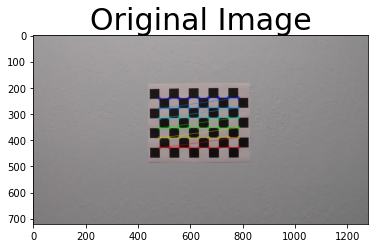

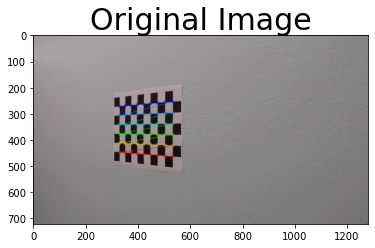

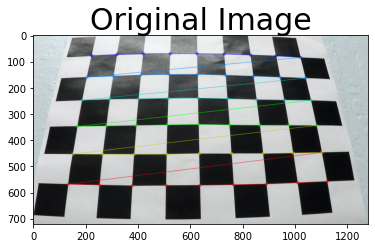

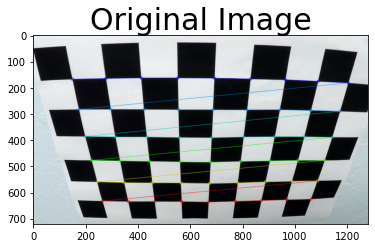

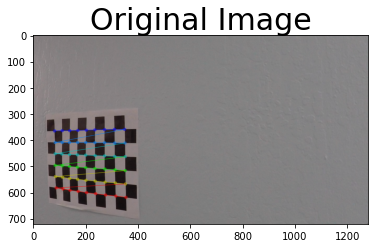

...

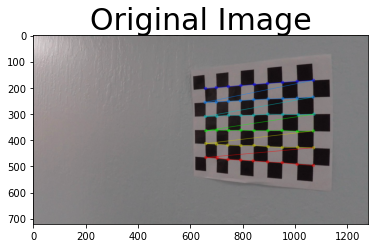

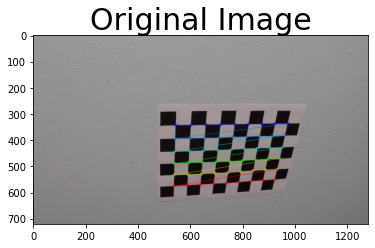

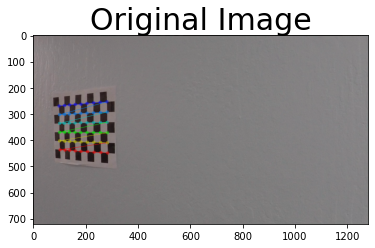

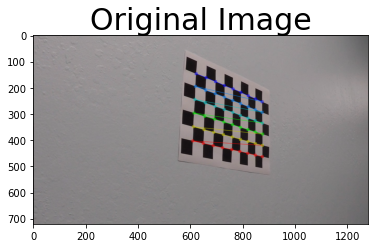

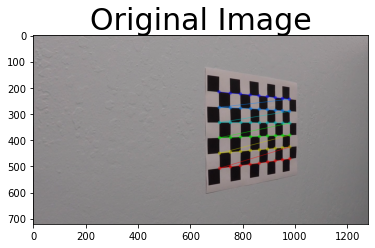

In [11]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        plt.figure()
        plt.imshow(img)
        plt.title('Original Image', fontsize=30)        
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

#cv2.destroyAllWindows()

### If the above cell ran sucessfully, you should now have objpoints and imgpoints needed for camera calibration. Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

Text(0.5, 1.0, 'Undistorted Image')

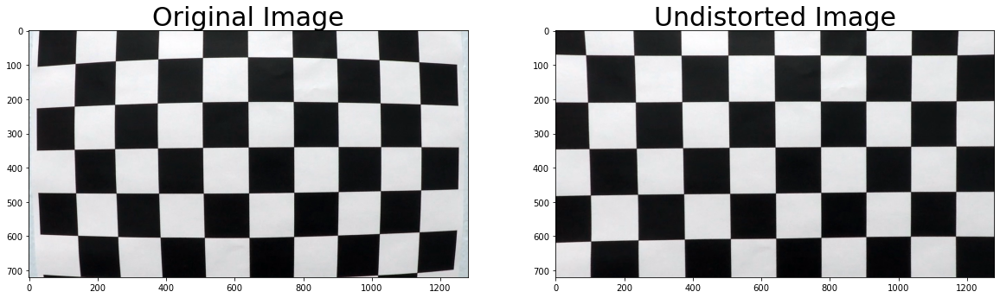

In [12]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)
#cv2.imwrite('calibration_wide/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
#dist_pickle = {}
#dist_pickle["mtx"] = mtx
#dist_pickle["dist"] = dist
#pickle.dump( dist_pickle, open( "calibration_wide/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)


## 2. Apply a distortion correction to raw images (assuming calibration known)

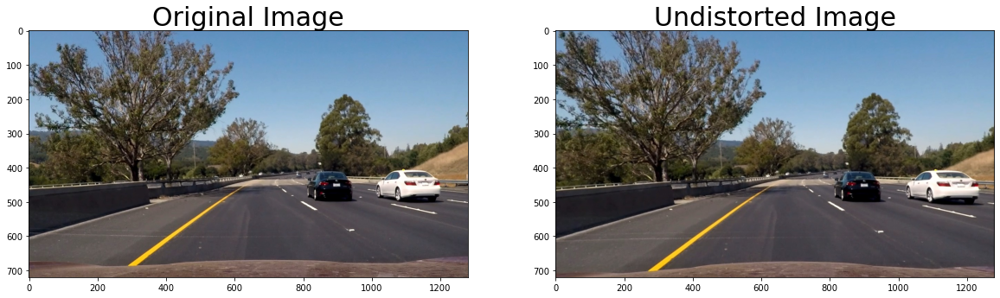

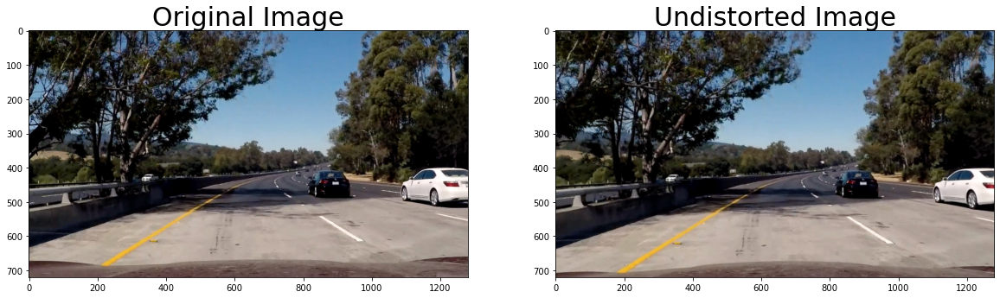

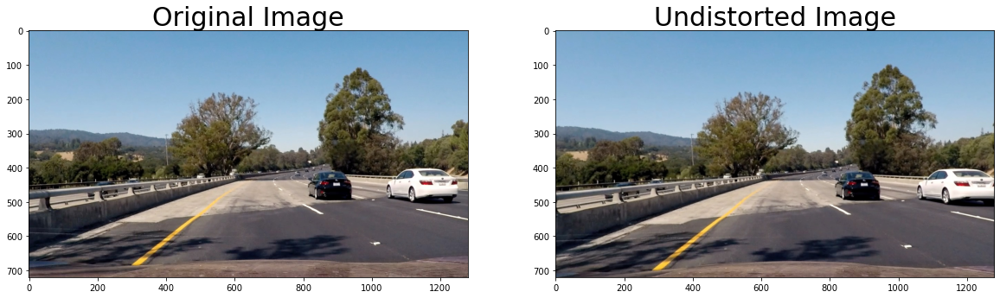

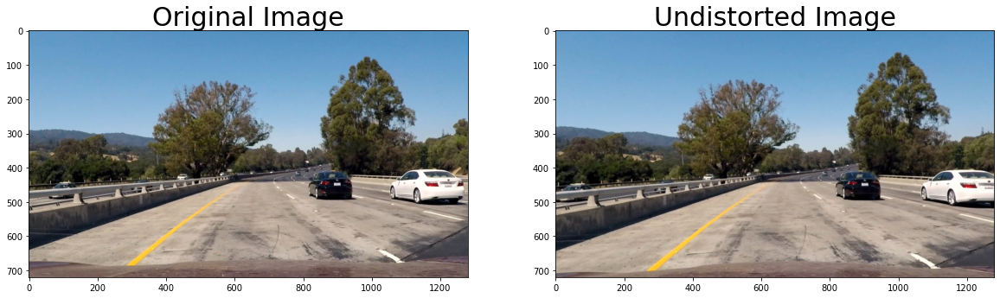

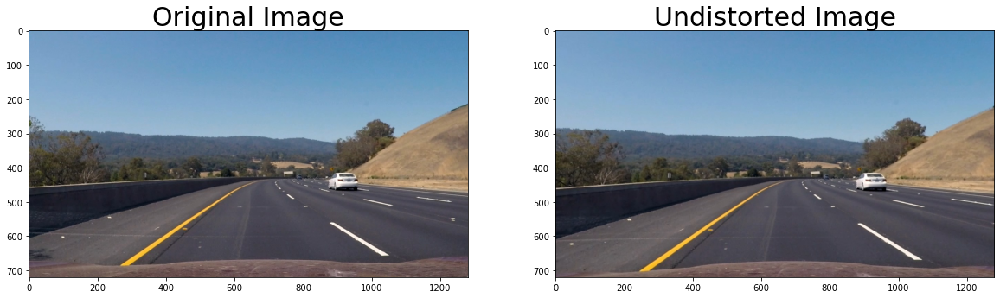

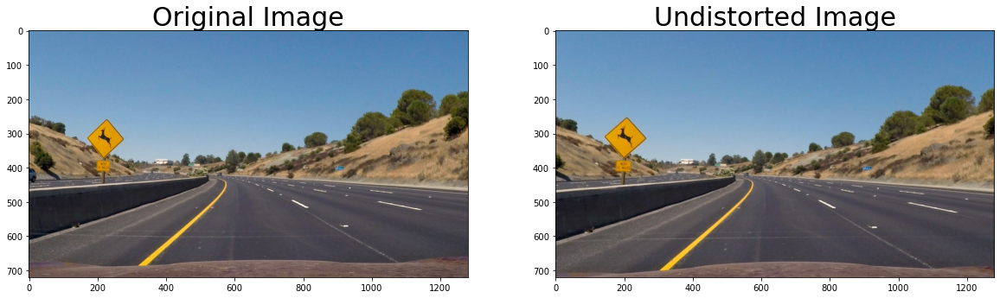

In [13]:
%matplotlib inline

# Correcting the image distortion
def dist_correct(img, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

## Testing the function
undstrt = [] # list of undisotrted images
# Make a list of distorted images
images = glob.glob('test_images/test*.jpg')
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    # correct the distortion from the test image
    dst = dist_correct(img, objpoints, imgpoints)
    undstrt.append(dst)
    #plotting the last image to check if the function worked
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    img2 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax1.imshow(img2)
    ax1.set_title('Original Image', fontsize=30)
    dst = cv2.cvtColor(dst,cv2.COLOR_BGR2RGB)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)


## 3. Combining a color transform to HLS and gradient thresholding to create a thresholded binary image

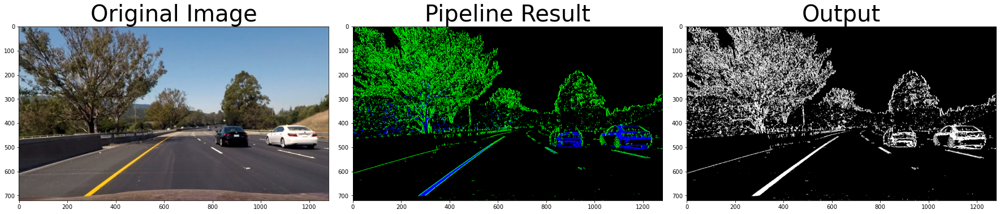

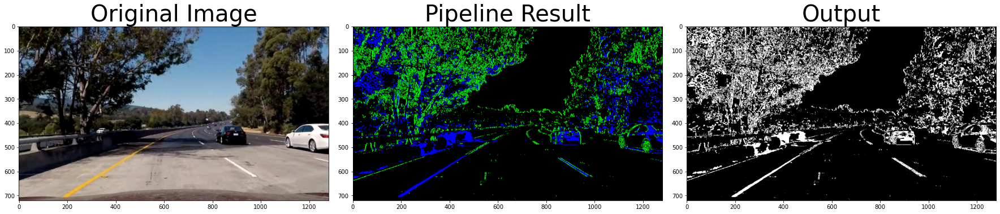

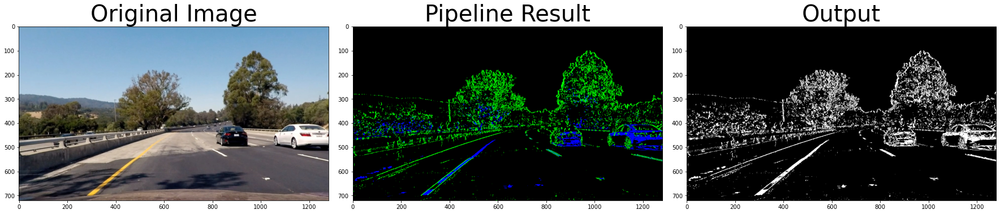

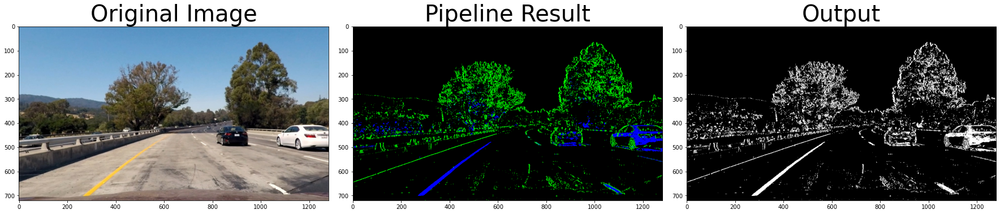

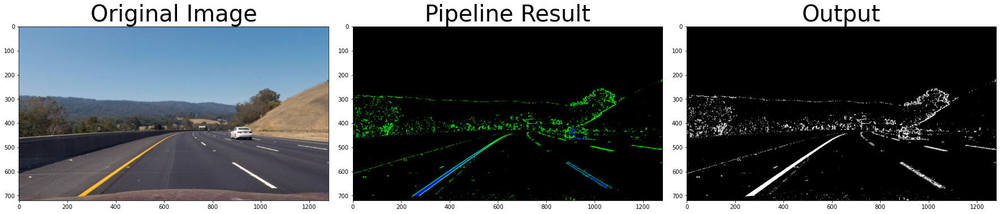

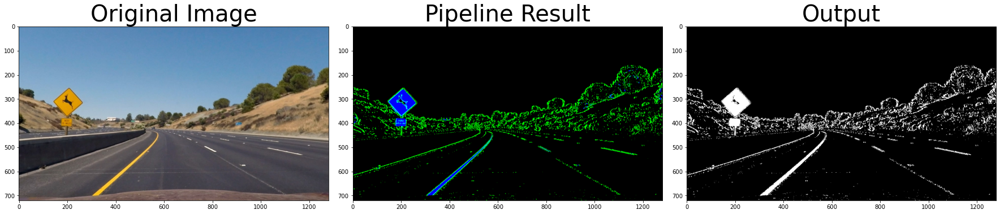

In [39]:
def threshold_img(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the L channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    binary = (s_binary+sxbinary) * 255
    return color_binary, binary

threshold_imgs = [] # Output to other functions
for img in undstrt :
    color, gray = threshold_img(img)
    threshold_imgs.append(gray)
    
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax1.imshow(rgb)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(color)
    ax2.set_title('Pipeline Result', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    ax3.imshow(gray, cmap = 'gray')
    ax3.set_title('Output', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 4. Applying a perspective transform to rectify binary image ("birds-eye view")

#### I will identify four source points for the perspective transform. In this case, I will assume the road is a flat plane. This isn't strictly true, but it can serve as an approximation for this project. I will pick four points in a trapezoidal shape (similar to region masking) that would represent a rectangle when looking down on the road from above.

#### The easiest way to do this is to investigate an image where the lane lines are straight, and find four points lying along the lines that, after perspective transform, I will make the lines look straight and vertical from a bird's eye view perspective.

#### One interesting aspect to perspective warping for tuning paramters is the use of a UI to tune the output destination, since a manually fitting the trapezoid is straightforward, the destination points can be tuned properly using two sliders that change their initial x and final x positions (y will be constant because the lines need to be parallel)

In [8]:
def transform(img, corners, lower, upper):
    # Pass in your image and corners to transform into this function
    # find the source points from the corners
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    # define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    offset = 250 #offset for dst points
    img_size = (img.shape[1], img.shape[0]) # Grab the image shape
    # For destination points, I'm manually fitting to get 
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[lower,img_size[1]],[lower,0],[upper,0],[upper,img_size[1]]])
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, dst

def ui(lower, upper):
    ## Input the image
    img = cv2.imread('test_images/straight_lines2.jpg')
    img2 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    img_size = (img.shape[1], img.shape[0]) # Grab the image shape
    pts = np.array([[200,img.shape[0]],[600,450],[690,450],[1110,img.shape[0]]], np.int32)
    pts = pts.reshape((-1,1,2))
    ## unwarp to test M matrix
    top_down, perspective_M, dst = transform(img2, pts, lower, upper)
    out_pts = np.int32(dst)
    ## Plotting
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    #draw polygon
    cv2.polylines(img2,[pts],True,(255,0,0), thickness=3)
    ax1.imshow(img2)
    ax1.set_title('Undistored Image', fontsize=50)
    #draw polygon
    cv2.polylines(top_down,[out_pts],True,(255,0,0), thickness=3)
    ax2.imshow(top_down)
    ax2.set_title('Warped results', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

layout = widgets.Layout(width = '800px', height = '50px')
interact(ui,lower=widgets.IntSlider(min=0, max=1300, step=5, value=300, layout=layout), upper=widgets.IntSlider(min=0, max=1300, step=5, value=900,layout=layout))


interactive(children=(IntSlider(value=300, description='lower', layout=Layout(height='50px', width='800px'), m…

<function __main__.ui(lower, upper)>

#### Those same four source points will now work to transform any image (again, under the assumption that the road is flat and the camera perspective hasn't changed). When applying the transform to new images, the test of whether or not you got the transform correct, is that the lane lines should appear parallel in the warped images, whether they are straight or curved.

#### Results from interactive GUI :
    * src = np.array([[200,img.shape[0]],[600,450],[690,450],[1110,img.shape[0]]], np.int32)
    * lower = 340
    * upper = 900
    * dst = np.float32([[lower,img_size[1]],[lower,0],[upper,0],[upper,img_size[1]]])

## Applying perspective Transform to all binary thresholded images

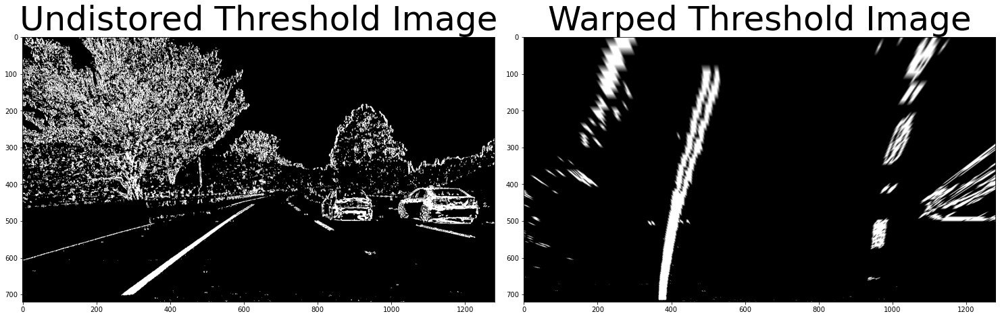

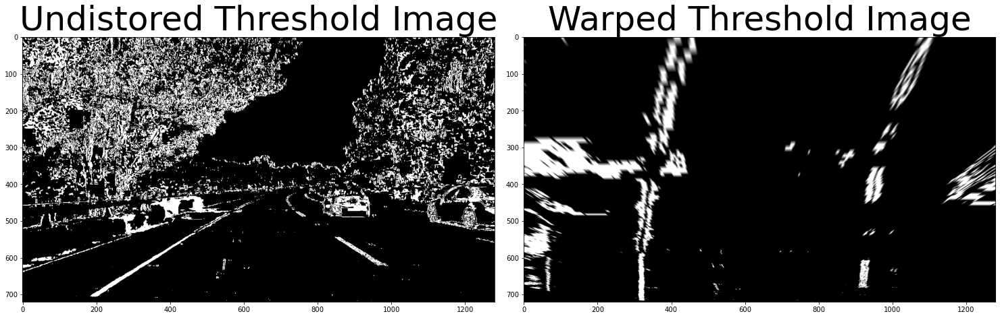

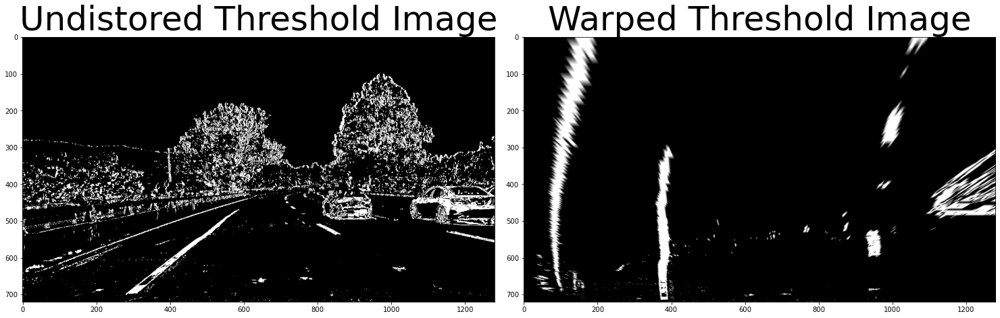

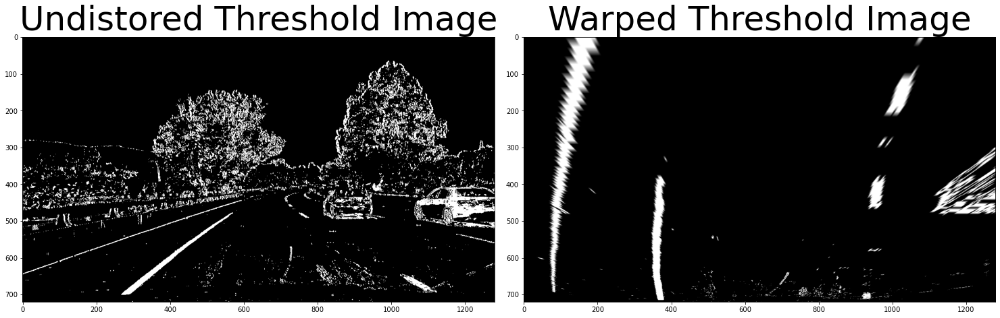

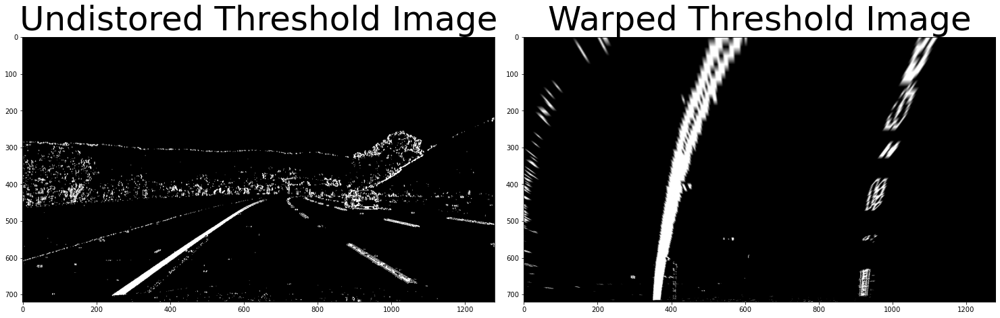

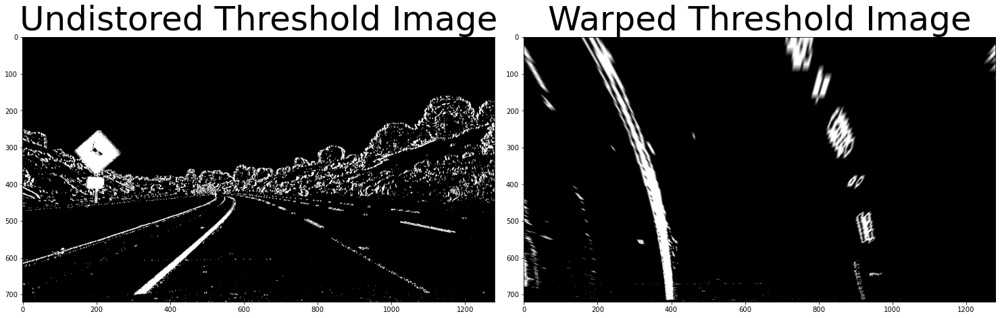

In [44]:
transformed_imgs = [] # Output to other functions
for img in threshold_imgs :    
    # Transform Parameters
    img_size = (img.shape[1], img.shape[0]) # Grab the image shape
    src = np.array([[200,img.shape[0]],[600,450],[690,450],[1110,img.shape[0]]], np.int32)
    src = src.reshape((-1,1,2))
    lower = 340
    upper = 900    
    ## unwarp to test M matrix
    top_down, perspective_M, dst = transform(img, src, lower, upper)
    transformed_imgs.append(top_down)
    ## Plotting
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(img, cmap = 'gray')
    ax1.set_title('Undistored Threshold Image', fontsize=50)
    ax2.imshow(top_down, cmap = 'gray')
    ax2.set_title('Warped Threshold Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 5. Detect lane pixels and fit to find the lane boundary.

### Line Finding Method: Peaks in a Histogram

#### After applying calibration, thresholding, and a perspective transform to a road image, I have a binary image where the lane lines stand out clearly. I still need to decide explicitly which pixels are part of the lines and which belong to the left line and which belong to the right line.

#### Plotting a histogram of where the binary activations occur across the image is one solution for this. 


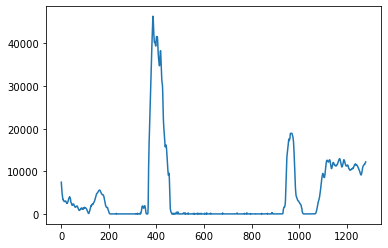

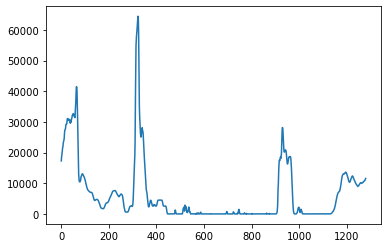

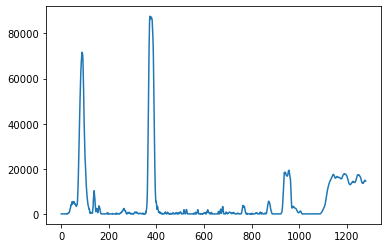

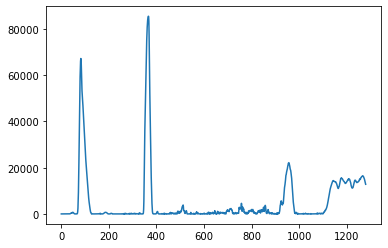

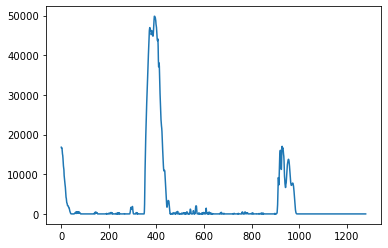

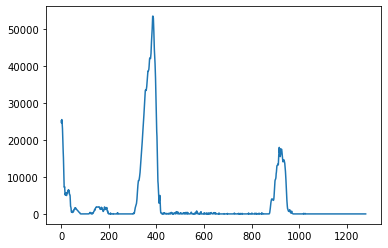

In [46]:
def hist(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

for img in transformed_imgs :
    # Create histogram of image binary activations
    histogram = hist(img)
    # Visualize the resulting histogram
    plt.figure()
    plt.plot(histogram)

#### It is clearly shown in the previous code that a histogram will work appropriately as the initial guess to determien where the lane lines are located 

### Next step is to implement sliding windows to fit a polynomial which estimates the lane lines

### Split the histogram for the two lines
 * The first step we'll take is to split the histogram into two sides, one for each lane line

### Set up windows and window hyperparameters
 * Our next step is to set a few hyperparameters related to our sliding windows, and set them up to iterate across the binary activations in the image. 

### Iterate through nwindows to track curvature
 * Now that I've set up what the windows look like and have a starting point, we'll want to loop for nwindows, with the given window sliding left or right if it finds the mean position of activated pixels within the window to have shifted.
 
1. Loop through each window in nwindows
2. Find the boundaries of our current window. This is based on a combination of the current window's starting point (leftx_current and rightx_current), as well as the margin you set in the hyperparameters.
3. Use cv2.rectangle to draw these window boundaries onto our visualization image out_img. This is required for the quiz, but you can skip this step in practice if you don't need to visualize where the windows are.
4. Now that we know the boundaries of our window, find out which activated pixels from nonzeroy and nonzerox above actually fall into the window.
5. Append these to our lists left_lane_inds and right_lane_inds.
6. If the number of pixels you found in Step 4 are greater than your hyperparameter minpix, re-center our window (i.e. leftx_current or rightx_current) based on the mean position of these pixels.

### Fit a polynomial
 * Now that I have found all our pixels belonging to each line through the sliding window method, it's time to fit a polynomial to the line. First, I have a couple small steps to ready our pixels.

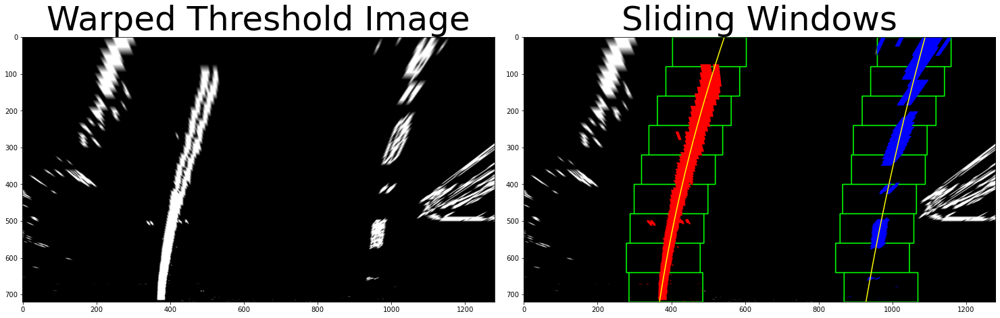

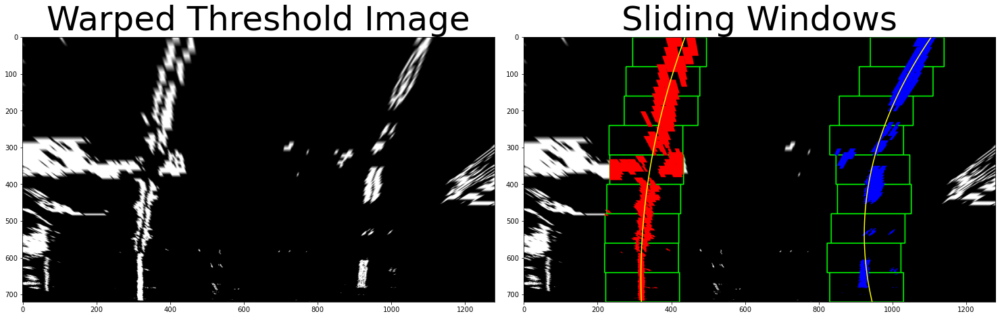

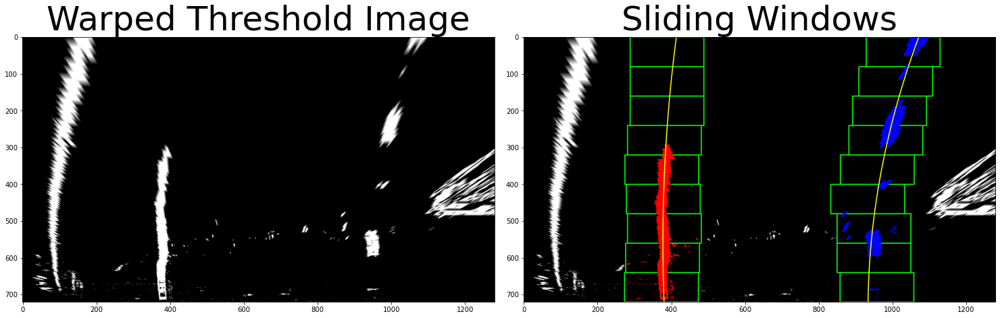

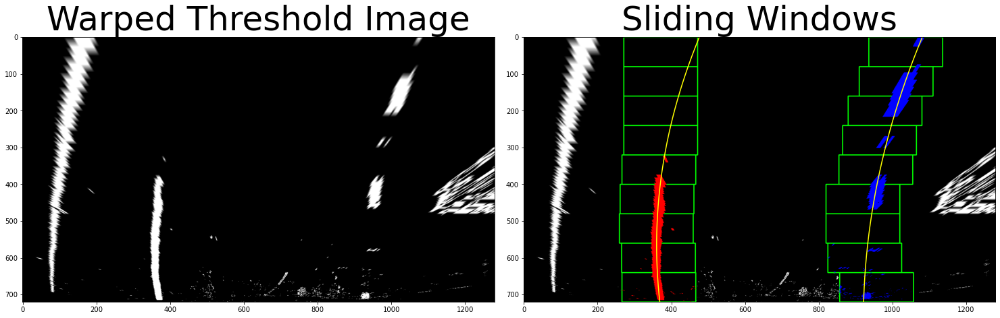

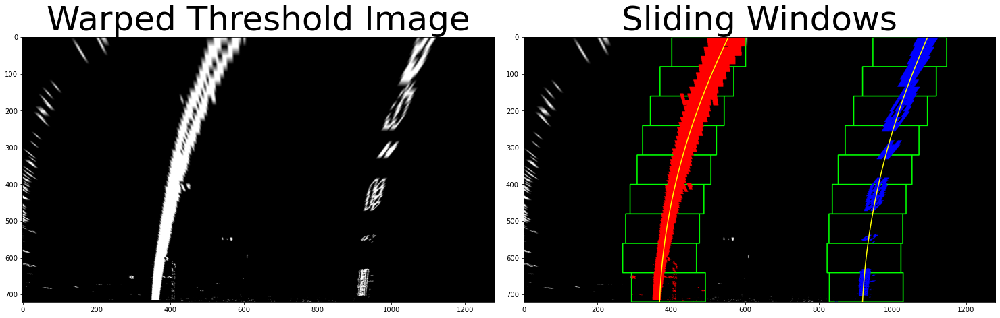

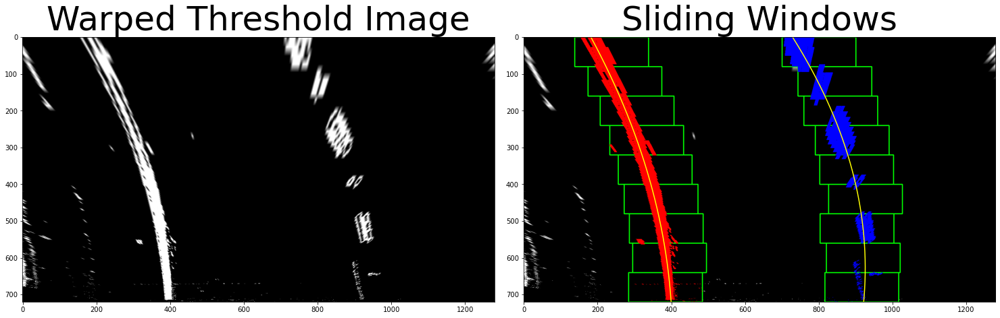

In [130]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')

    return out_img, left_fit, right_fit

left_polys = [] # Output to other functions
right_polys = [] # Output to other functions
for img in transformed_imgs:  
    ## Plotting
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(img, cmap = 'gray')
    ax1.set_title('Warped Threshold Image', fontsize=50)
    
    out_img, left_fit, right_fit = fit_polynomial(img)
    left_polys.append(left_fit)
    right_polys.append(right_fit)

    ax2.imshow(out_img)
    ax2.set_title('Sliding Windows', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Search from prior algorithm

#### I have built an algorithm that uses sliding windows to track the lane lines out into the distance. However, using the full algorithm from before and starting fresh on every frame may seem inefficient, as the lane lines don't necessarily move a lot from frame to frame.

#### In the next frame of video I don't need to do a blind search again, but instead I can just search in a margin around the previous lane line position, like in the above image. The green shaded area shows where I searched for the lines this time. So, once I know where the lines are in one frame of video, I can do a highly targeted search for them in the next frame.

#### This is equivalent to using a customized region of interest for each frame of video, and should help me track the lanes through sharp curves and tricky conditions. If I lose track of the lines, go back to my sliding windows search or other method to rediscover them.

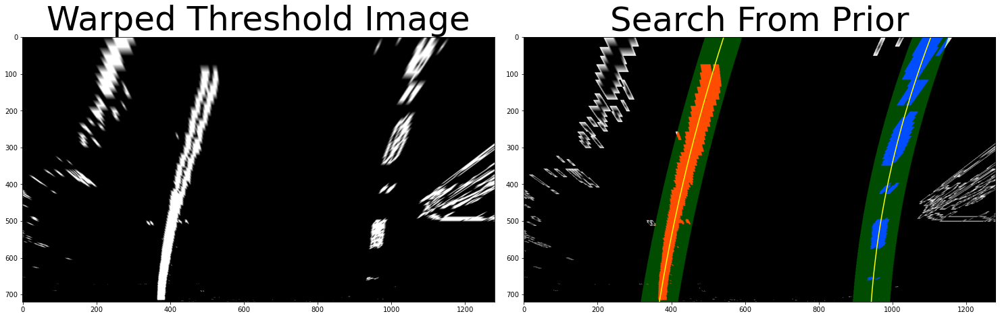

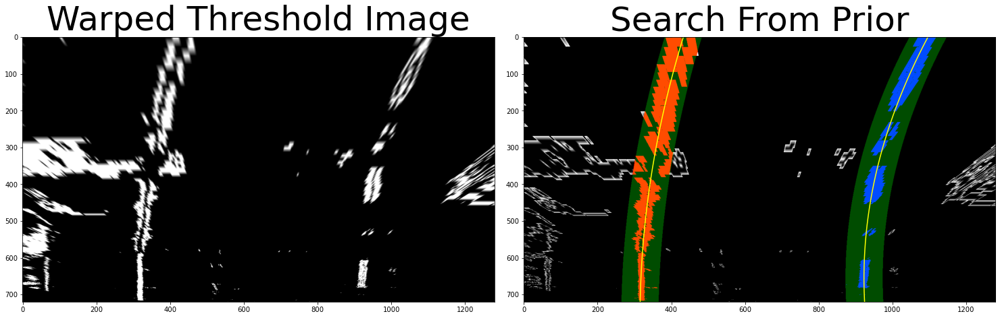

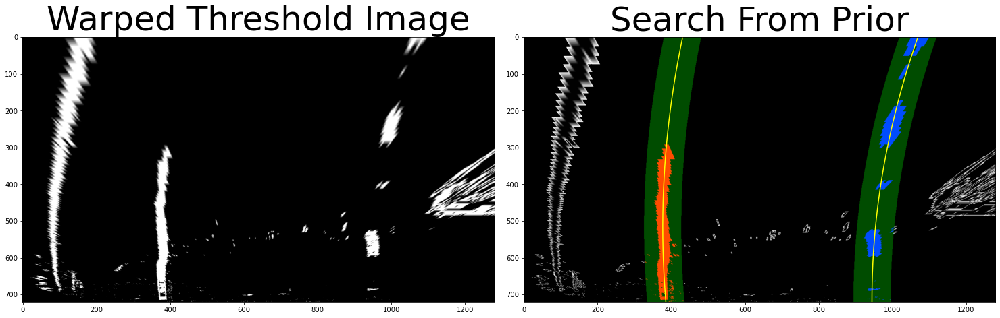

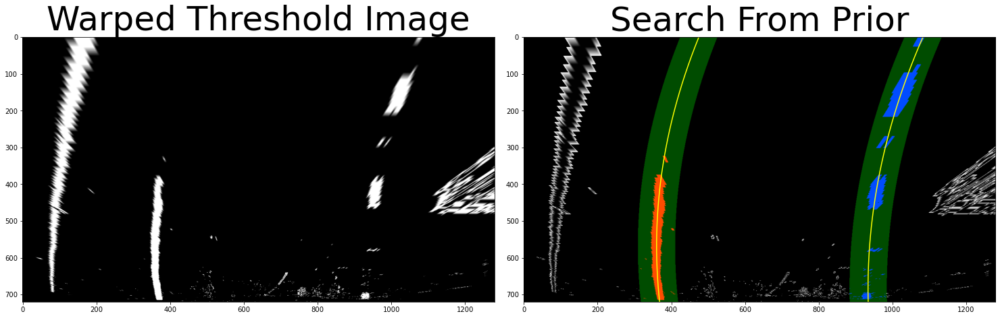

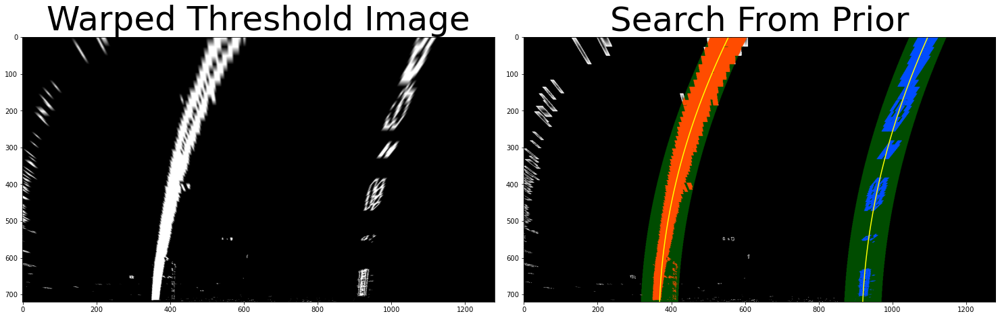

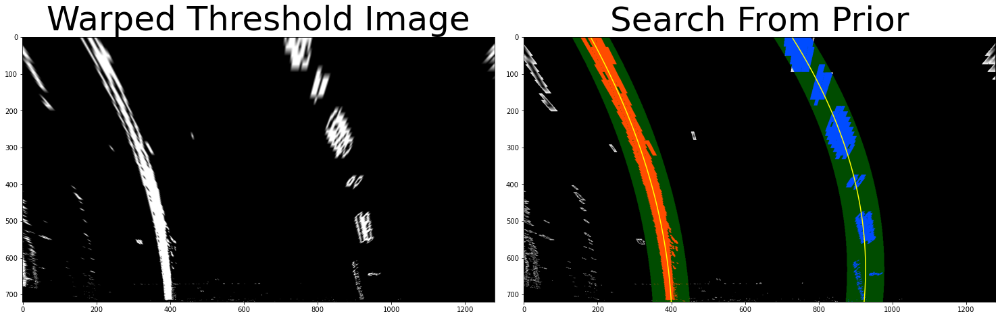

In [240]:
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit, margin):
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Visualization terms
    visuals = [leftx, lefty, rightx, righty, margin, binary_warped]
    
    # Fit new polynomials
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    return left_fit, right_fit, left_fitx, right_fitx, ploty, visuals

def visualize_poly(left_fitx, right_fitx, ploty, visuals):
    ## Visualization ##
    leftx = visuals[0]
    lefty = visuals[1]
    rightx = visuals[2]
    righty = visuals[3]
    margin = visuals[4]
    binary_warped = visuals[5]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result


# HYPERPARAMETER
# Choose the width of the margin around the previous polynomial to search
margin = 50

left_fitx_list = []
right_fitx_list = []

for i in range(len(transformed_imgs)):  
    ## Plotting
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    ax1.imshow(transformed_imgs[i], cmap = 'gray')
    ax1.set_title('Warped Threshold Image', fontsize=50)

    left_fit, right_fit, left_fitx, right_fitx, out_img, visuals = search_around_poly(transformed_imgs[i], left_polys[i], right_polys[i], margin)
    out_img2 = visualize_poly(left_fitx, right_fitx, out_img, visuals)

    left_polys[i] = left_fit
    right_polys[i] = right_fit
    left_fitx_list.append(left_fitx)
    right_fitx_list.append(right_fitx)
    
    ax2.imshow(out_img2)
    ax2.set_title('Search From Prior', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 6. Determine the curvature of the lane and vehicle position with respect to center.


#### Using the radius of a curve equation to caluclate the left curve radius and right curve radius - note this is in Pixels!

In [220]:
def generate_data():
    '''
    Generates fake data to use for calculating lane curvature.
    In your own project, you'll ignore this function and instead
    feed in the output of your lane detection algorithm to
    the lane curvature calculation.
    '''
    # Set random seed number so results are consistent for grader
    # Comment this out if you'd like to see results on different random data!
    np.random.seed(0)
    # Generate some fake data to represent lane-line pixels
    ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
    quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
    # For each y position generate random x position within +/-50 pix
    # of the line base position in each case (x=200 for left, and x=900 for right)
    leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])
    rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                    for y in ploty])

    leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
    rightx = rightx[::-1]  # Reverse to match top-to-bottom in y

    # Fit a second order polynomial to pixel positions in each fake lane line
    left_fit = np.polyfit(ploty, leftx, 2)
    right_fit = np.polyfit(ploty, rightx, 2)
    
    return ploty, left_fit, right_fit

def measure_curvature_pixels(ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in pixels.
    '''    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    
    return left_curverad, right_curverad

# DEBUG ## 
ploty, left_fit, right_fit = generate_data()
left_curverad, right_curverad = measure_curvature_pixels(ploty, left_fit, right_fit)
print("Generate Data Results: ", left_fit, right_fit)
print("Pipeline Results: ", left_polys[0], right_polys[0])
print(left_curverad, right_curverad)

# for i in range(len(transformed_imgs)):  
#     # Calculate the radius of curvature in pixels for both lane lines
#     left_curverad, right_curverad = measure_curvature_pixels(threshold_imgs[i], left_polys[i], right_polys[i])

#     print(left_curverad, right_curverad)

Generate Data Results:  [ 3.07683280e-04 -4.44713275e-01  3.59067572e+02] [ 2.53380891e-04 -3.96103079e-01  1.04908806e+03]
Pipeline Results:  [ 1.25654334e-04 -3.34586802e-01  5.43766116e+02] [ 6.94223163e-05 -2.72736192e-01  1.08849530e+03]
1625.0601831657204 1976.2967307714334


### From Pixels to Real-World

#### I've calculated the radius of curvature based on pixel values, so the radius I am reporting is in pixel space, which is not the same as real world space. So I need to repeat this calculation after converting our x and y values to real world space. This involves measuring how long and wide the section of lane is that I have projected in the warped image. I could do this in detail by measuring out the physical lane in the field of view of the camera, but for this project, I will assume that if I am projecting a section of lane similar to the images above, the lane is about 30 meters long and 3.7 meters wide. Or, if you prefer to derive a conversion from pixel space to world space in your own images, compare your images with U.S. regulations that require a minimum lane width of 12 feet or 3.7 meters, and the dashed lane lines are 10 feet or 3 meters long each.

#### Let's say that our camera image has 720 relevant pixels in the y-dimension (remember, our image is perspective-transformed!), and we'll say roughly 600 relevant pixels in the x-dimension. Therefore, to convert from pixels to real-world meter measurements, we can use:

####  Define conversions in x and y from pixels space to meters
* ym_per_pix = 30/720 # meters per pixel in y dimension
* xm_per_pix = 3.7/600 # meters per pixel in x dimension


In [272]:
def measure_curvature_real(ploty, left_fit, right_fit):
    '''
    Calculates the curvature of polynomial functions in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/600 # meters per pixel in x dimension

    # Converts the A, B, C coefficients of the polynomial (parabola) from pixels to meters
    left_fit_cr = [left_fit[0]*(xm_per_pix / ym_per_pix**2), left_fit[1]*(xm_per_pix / ym_per_pix), left_fit[2]]
    right_fit_cr = [right_fit[0]*(xm_per_pix / ym_per_pix**2), right_fit[1]*(xm_per_pix / ym_per_pix), right_fit[2]]
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### Implement the calculation of R_curve (radius of curvature) #####
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Find how far the car is from the center of the lane
    center = find_center(img, left_fit, right_fit, xm_per_pix) 
    
    return left_curverad, right_curverad, center 

# Distance from center is image x midpoint - mean of left_fit and right_fit intercepts 
def find_center(img, left_fit, right_fit, xm_per_pix) :
    car_position = img.shape[1]/2
    h = img.shape[0]
    left_fitx = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fitx = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    lane_center_position = (left_fitx + right_fitx) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    return center_dist

curve_rad = []
dist_cent = []
for i in range(len(transformed_imgs)):  
    left_curverad, right_curverad, center = measure_curvature_real(transformed_imgs[i], left_polys[i], right_polys[i])
    print(left_curverad, 'm', right_curverad, 'm', center, 'm')
    curve_rad.append((left_curverad + right_curverad) / 2)
    dist_cent.append(center)

1325.7938789720797 m 775.3717957054566 m -0.09312132784841166 m
816.6587899007474 m 594.1158883000465 m 0.12357287448526263 m
816.9555737648834 m 713.6641503193954 m -0.15282621987039405 m
615.5507197665252 m 627.2716477607637 m -0.06914333789543319 m
626.6253175180569 m 661.5311833737741 m -0.023818097299337447 m
604.7955263271998 m 602.1735432432049 m -0.1327902865218768 m


## 7. Warp the detected lane boundaries back onto the original image.


#### Once I had a good measurement of the line positions in warped space, it's time to project my measurement back down onto the road! Let's suppose, I have a warped binary image called warped, and I have fit the lines with a polynomial and have arrays called ploty, left_fitx and right_fitx, which represent the x and y pixel values of the lines. I can then project those lines onto the original image as follows:

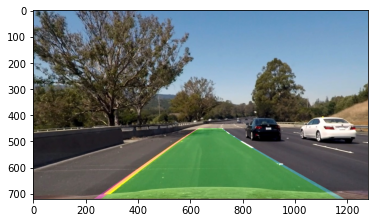

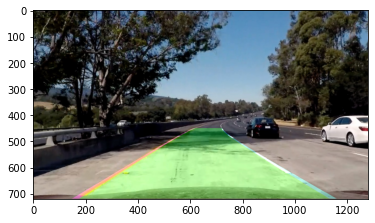

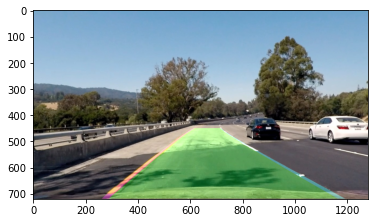

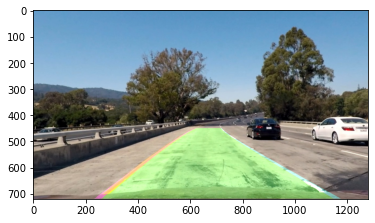

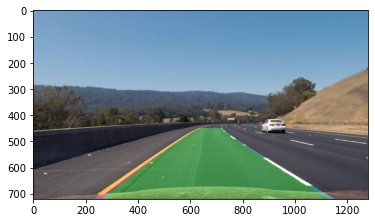

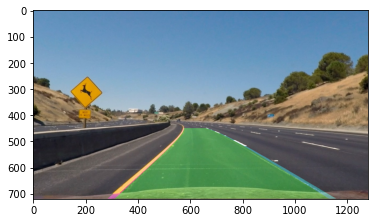

In [251]:
for i in range(len(threshold_imgs)):
    warped = threshold_imgs[i]
    left_fitx = left_fitx_list[i]
    right_fitx = right_fitx_list[i]
    Minv = np.linalg.inv(perspective_M)
    undist = cv2.cvtColor(undstrt[i],cv2.COLOR_BGR2RGB)
    plt.figure()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    plt.imshow(result)

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

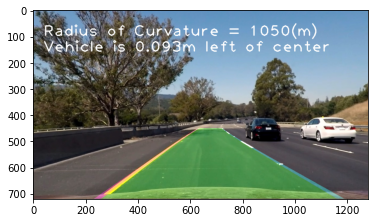

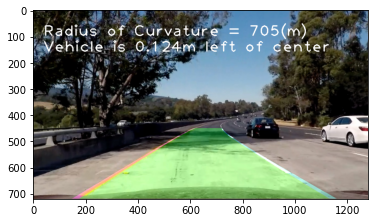

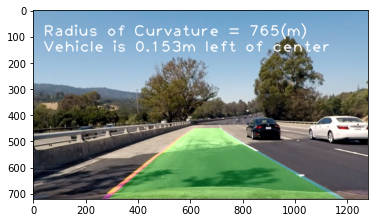

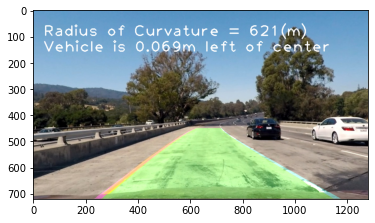

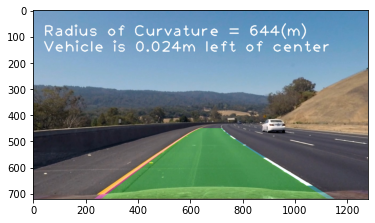

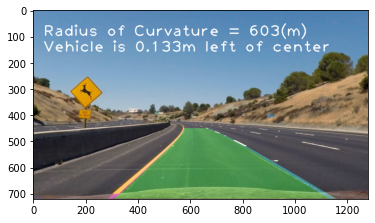

In [288]:
def draw_stats(warped, left_fitx, right_fitx, Minv, undsit, curve_rad, dist_cent):
    plt.figure()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    # Adding the text
    text1 = "Radius of Curvature = " + str(int(curve_rad)) + "(m)"
    if dist_cent < 0 :
        text2 = "Vehicle is " + '{:04.3f}'.format(np.abs(dist_cent)) + "m left of center"
    else :
        text2 = "Vehicle is " + '{:04.3f}'.format(np.abs(dist_cent)) + "m left of center"
    out = cv2.putText(result, text1, (40,100), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness = 4)
    out = cv2.putText(result, text2, (40,160), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness = 4)
    plt.imshow(out)

for i in range(len(threshold_imgs)):
    warped = threshold_imgs[i]
    left_fitx = left_fitx_list[i]
    right_fitx = right_fitx_list[i]
    Minv = np.linalg.inv(perspective_M)
    undist = cv2.cvtColor(undstrt[i],cv2.COLOR_BGR2RGB)
    draw_stats(warped,left_fitx,right_fitx,Minv,undist, curve_rad[i], dist_cent[i])

# Advanced Lane Finder Pipeline

#### At this point all of the previous samples will be used to compile the image processing pipeline

In [ ]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None


### Helper Functions - run this before running pipeline

In [ ]:
#importing some useful packages
from __future__ import print_function
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import pickle
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
%matplotlib inline

# cal_images = 'camera_cal/calibration*.jpg'
def camera_calibration(cal_images)
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(cal_images)

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    return objpoints,imgpoints
            
# Correcting the image distortion - returns undistorted image after inputting the calibration points
def dist_correct(img, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0])
    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

# Combining a color transform to HLS and gradient thresholding to create a thresholded binary image
def threshold_img(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the L channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    binary = (s_binary+sxbinary) * 255
    return color_binary, binary

# Applying a perspective transform to rectify binary image ("birds-eye view")
def transform(img, corners, lower=340, upper=900):
    # Pass in your image and corners to transform into this function
    # find the source points from the corners
    src = np.float32([corners[0], corners[1], corners[2], corners[3]])
    # define 4 destination points dst = np.float32([[,],[,],[,],[,]])
    offset = 250 #offset for dst points
    img_size = (img.shape[1], img.shape[0]) # Grab the image shape
    # For destination points, I'm manually fitting to get 
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[lower,img_size[1]],[lower,0],[upper,0],[upper,img_size[1]]])
    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped, M, dst

# Sliding window polynomial finder
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window #
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    ### Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    return out_img, left_fit, right_fit

# Search from prior methods
def fit_poly(img_shape, leftx, lefty, rightx, righty):
    ### Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, left_fit, right_fit, margin):
    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Visualization terms
    visuals = [leftx, lefty, rightx, righty, margin, binary_warped]
    
    # Fit new polynomials
    left_fit, right_fit, left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    return left_fit, right_fit, left_fitx, right_fitx, ploty, visuals

def visualize_poly(left_fitx, right_fitx, ploty, visuals):
    ## Visualization ##
    leftx = visuals[0]
    lefty = visuals[1]
    rightx = visuals[2]
    righty = visuals[3]
    margin = visuals[4]
    binary_warped = visuals[5]
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    ## End visualization steps ##
    
    return result

def draw_stats(warped, left_fitx, right_fitx, Minv, undsit, curve_rad, dist_cent):
    plt.figure()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (undist.shape[1], undist.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    # Adding the text
    text1 = "Radius of Curvature = " + str(int(curve_rad)) + "(m)"
    if dist_cent < 0 :
        text2 = "Vehicle is " + '{:04.3f}'.format(np.abs(dist_cent)) + "m left of center"
    else :
        text2 = "Vehicle is " + '{:04.3f}'.format(np.abs(dist_cent)) + "m left of center"
    out = cv2.putText(result, text1, (40,100), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness = 4)
    out = cv2.putText(result, text2, (40,160), cv2.FONT_HERSHEY_PLAIN, 4, (255,255,255), thickness = 4)
    plt.imshow(out)

## Advanced Lane Finder Pipeline

#### Built pipeline to run my solution and on all test_images. 

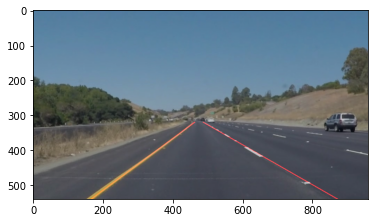

## Test on Images

#### Made copies of results in `test_images_output`

In [ ]:
left_line = Line()
right_line = Line()

## First do a calibration (one time operation)
cal_images = 'camera_cal/calibration*.jpg'
objpoints, imgpoints = camera_calibration(cal_images)
## Testing the function
undstrt = [] # list of undisotrted images
# Make a list of distorted images
images = glob.glob('test_images/test*.jpg')
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    # correct the distortion from the test image
    dst = dist_correct(img, objpoints, imgpoints)
    undstrt.append(dst)
    #plotting the last image to check if the function worked
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    img2 = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    ax1.imshow(img2)
    ax1.set_title('Original Image', fontsize=30)
    dst = cv2.cvtColor(dst,cv2.COLOR_BGR2RGB)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [9]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [79]:
def process_image(image):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # you should return the final output (image where lines are drawn on lanes)
    # Read in and grayscale the image
    gray = grayscale(image)

    # Define a kernel size and apply Gaussian smoothing
    kernel_size = 5
    blur_gray = gaussian_blur(gray, kernel_size)

    # Define our parameters for Canny and apply
    low_threshold = 50
    high_threshold = 150
    edges = canny(blur_gray, low_threshold, high_threshold)

    # Next we'll create a masked edges image using cv2.fillPoly()
    imshape = image.shape
    vertices = np.array([[(0,imshape[0]),(imshape[1]/2-50,imshape[0]/2+50), (imshape[1]/2+50,imshape[0]/2+50), (imshape[1],imshape[0])]], dtype=np.int32)
    masked_image = region_of_interest(edges, vertices)

    # Define the Hough transform parameters
    # Make a blank the same size as our image to draw on
    rho = 2 # distance resolution in pixels of the Hough grid
    theta = np.pi/180 # angular resolution in radians of the Hough grid
    threshold = 15     # minimum number of votes (intersections in Hough grid cell)
    min_line_length = 40 #minimum number of pixels making up a line
    max_line_gap = 20    # maximum gap in pixels between connectable line segments

    # Run Hough on edge detected image
    # Output "lines" is an array containing endpoints of detected line segments
    line_img = hough_lines(masked_image, rho, theta, threshold, min_line_length, max_line_gap)

    # Draw the lines on the edge image
    lines_edges = weighted_img(line_img, image) 
    return lines_edges

Let's try the one with the solid white lane on the right first ...

In [80]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

                                                              

                                                        
t:   6%|▋         | 16/251 [19:20<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [18:28<00:02, 113.19it/s, now=None]
                                                              

                                                        
t:   6%|▋         | 16/251 [19:20<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [18:53<00:02, 113.99it/s, now=None]


t:   0%|          | 0/221 [00:00<?, ?it/s, now=None]


t:  10%|▉         | 21/221 [00:00<00:00, 204.35it/s, now=None]

Moviepy - Building video test_videos_output/solidWhiteRight.mp4.
Moviepy - Writing video test_videos_output/solidWhiteRight.mp4






t:  20%|█▉        | 44/221 [00:00<00:00, 209.45it/s, now=None]


t:  25%|██▍       | 55/221 [00:00<00:01, 161.17it/s, now=None]


t:  33%|███▎      | 72/221 [00:00<00:00, 161.80it/s, now=None]


t:  40%|████      | 89/221 [00:00<00:00, 163.35it/s, now=None]


t:  48%|████▊     | 106/221 [00:00<00:00, 164.64it/s, now=None]


t:  55%|█████▌    | 122/221 [00:00<00:00, 161.95it/s, now=None]


t:  63%|██████▎   | 139/221 [00:00<00:00, 162.39it/s, now=None]


t:  71%|███████   | 156/221 [00:00<00:00, 163.45it/s, now=None]


t:  79%|███████▊  | 174/221 [00:01<00:00, 165.83it/s, now=None]


t:  86%|████████▋ | 191/221 [00:01<00:00, 165.77it/s, now=None]


t:  94%|█████████▍| 208/221 [00:01<00:00, 164.58it/s, now=None]


                                                               

                                                        
t:   6%|▋         | 16/251 [19:21<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [18:30<00:02, 113.19it/s, now=None]
                          

Moviepy - Done !
Moviepy - video ready test_videos_output/solidWhiteRight.mp4
CPU times: user 1.7 s, sys: 422 ms, total: 2.13 s
Wall time: 1.56 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [81]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [84]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

                                                              

                                                        
t:   6%|▋         | 16/251 [20:01<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [19:09<00:02, 113.19it/s, now=None]
                                                              

                                                        
t:   6%|▋         | 16/251 [20:01<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [19:34<00:02, 113.99it/s, now=None]


t:   0%|          | 0/681 [00:00<?, ?it/s, now=None]


t:   3%|▎         | 21/681 [00:00<00:03, 205.43it/s, now=None]

Moviepy - Building video test_videos_output/solidYellowLeft.mp4.
Moviepy - Writing video test_videos_output/solidYellowLeft.mp4






t:   7%|▋         | 45/681 [00:00<00:02, 212.60it/s, now=None]


t:   8%|▊         | 57/681 [00:00<00:03, 165.26it/s, now=None]


t:  11%|█         | 74/681 [00:00<00:03, 165.59it/s, now=None]


t:  13%|█▎        | 90/681 [00:00<00:03, 163.30it/s, now=None]


t:  16%|█▌        | 107/681 [00:00<00:03, 162.51it/s, now=None]


t:  18%|█▊        | 124/681 [00:00<00:03, 162.72it/s, now=None]


t:  21%|██        | 141/681 [00:00<00:03, 162.85it/s, now=None]


t:  23%|██▎       | 157/681 [00:00<00:03, 161.77it/s, now=None]


t:  26%|██▌       | 174/681 [00:01<00:03, 162.88it/s, now=None]


t:  28%|██▊       | 192/681 [00:01<00:02, 166.62it/s, now=None]


t:  31%|███       | 209/681 [00:01<00:02, 164.38it/s, now=None]


t:  33%|███▎      | 226/681 [00:01<00:02, 162.29it/s, now=None]


t:  36%|███▌      | 243/681 [00:01<00:02, 159.99it/s, now=None]


t:  38%|███▊      | 259/681 [00:01<00:02, 159.45it/s, now=None]


t:  40%|████      | 275/681 [00:01<00:02, 159.20it/s, now=None]


t:  43%|███

Moviepy - Done !
Moviepy - video ready test_videos_output/solidYellowLeft.mp4
CPU times: user 5.34 s, sys: 1.29 s, total: 6.63 s
Wall time: 4.38 s


In [85]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [88]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

                                                              

                                                        
t:   6%|▋         | 16/251 [20:44<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [19:52<00:02, 113.19it/s, now=None]
                                                              

                                                        
t:   6%|▋         | 16/251 [20:44<00:02, 106.86it/s, now=None]

t:   6%|▋         | 16/251 [20:17<00:02, 113.99it/s, now=None]


t:   0%|          | 0/251 [00:00<?, ?it/s, now=None]


t:   4%|▍         | 11/251 [00:00<00:02, 107.79it/s, now=None]

Moviepy - Building video test_videos_output/challenge.mp4.
Moviepy - Writing video test_videos_output/challenge.mp4






t:   9%|▉         | 23/251 [00:00<00:02, 110.76it/s, now=None]


t:  14%|█▍        | 36/251 [00:00<00:01, 113.61it/s, now=None]


t:  19%|█▉        | 48/251 [00:00<00:01, 101.90it/s, now=None]


t:  23%|██▎       | 58/251 [00:00<00:01, 100.76it/s, now=None]


t:  27%|██▋       | 67/251 [00:00<00:01, 96.48it/s, now=None] 


t:  30%|███       | 76/251 [00:00<00:01, 91.88it/s, now=None]


t:  34%|███▍      | 85/251 [00:00<00:01, 88.13it/s, now=None]


t:  37%|███▋      | 94/251 [00:01<00:01, 84.02it/s, now=None]


t:  41%|████      | 103/251 [00:01<00:01, 81.50it/s, now=None]


t:  45%|████▍     | 112/251 [00:01<00:01, 82.64it/s, now=None]


t:  49%|████▊     | 122/251 [00:01<00:01, 84.68it/s, now=None]


t:  53%|█████▎    | 133/251 [00:01<00:01, 89.67it/s, now=None]


t:  57%|█████▋    | 142/251 [00:01<00:01, 79.98it/s, now=None]


t:  60%|██████    | 151/251 [00:01<00:01, 79.05it/s, now=None]


t:  64%|██████▎   | 160/251 [00:01<00:01, 79.32it/s, now=None]


t:  67%|██████▋   | 169/2

Moviepy - Done !
Moviepy - video ready test_videos_output/challenge.mp4
CPU times: user 4.05 s, sys: 867 ms, total: 4.92 s
Wall time: 3.35 s


In [89]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))